# Omnipose Segmentation Pipeline

This notebook demonstrates how to use Omnipose for cell segmentation and integrate it with the btrack tracking pipeline.

## Overview
1. Load and preprocess microscopy images
2. Run Omnipose segmentation
3. Convert segmentation masks to btrack objects
4. Perform cell tracking
5. Visualize results

In [16]:
# Import dependencies
import numpy as np
import omnipose

# set up plotting defaults
from omnipose.plot import imshow
omnipose.plot.setup()

# This checks to see if you have set up your GPU properly.
# CPU performance is a lot slower, but not a problem if you 
# are only processing a few images.
from omnipose.gpu import use_gpu
use_GPU = use_gpu()

## Setup Omnipose

First, let's properly import omnipose. Based on the previous notebook, we'll use the installed omnipose package.

In [17]:
# for plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 300
plt.style.use('dark_background')
%matplotlib inline

## Load Example Data

We'll start with the example dataset from btrack to test our pipeline.

In [18]:
from pathlib import Path
import os
import nd2

# Set path to your ND2 file
basedir = "/Volumes/AMBY SSD/datasets/nd2"  # Replace with your directory path
nd2_file = "SR_1_5_2h_Pre-C_3h_IPTG_After10h_05_MC.nd2"  # Replace with your ND2 filename
nd2_path = os.path.join(basedir, nd2_file)

Loading ONLY what we need...
Dask array shape: (37, 9, 3, 1040, 1392)
Extracting specific frames...
Loaded 2 frames successfully
Processed image 1: (1040, 1392)
Processed image 2: (1040, 1392)
Ready for segmentation with 2 images

Visualizing loaded images...
Frame 1: min=0.000, max=1.000
Frame 2: min=0.000, max=1.000


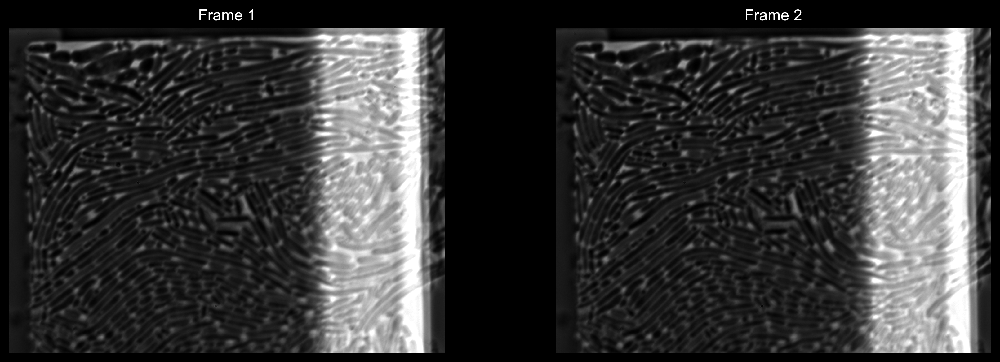

Images loaded and displayed successfully!


In [19]:
import nd2
import numpy as np
from cellpose_omni import transforms
from omnipose.utils import normalize99

print("Loading ONLY what we need...")

# Method 1: Use dask and select specific frames
imgs_dask = nd2.imread(nd2_path, dask=True)  # Lazy loading - doesn't actually load data
print(f"Dask array shape: {imgs_dask.shape}")

# Extract just 2 frames efficiently 
print("Extracting specific frames...")
frame1 = imgs_dask[0, 0, 0].compute()  # T=0, P=0, C=0
frame2 = imgs_dask[1, 0, 0].compute()  # T=1, P=0, C=0

imgs = [frame1, frame2]
print(f"Loaded {len(imgs)} frames successfully")

# Process immediately
processed_imgs = []
for k, img in enumerate(imgs):
    img_proc = transforms.move_min_dim(img)
    if len(img_proc.shape) > 2:
        img_proc = np.mean(img_proc, axis=-1)
    img_proc = normalize99(img_proc)
    processed_imgs.append(img_proc)
    print(f"Processed image {k+1}: {img_proc.shape}")

imgs = processed_imgs
nimg = len(imgs)
print(f"Ready for segmentation with {nimg} images")

# Quick visualization to see the loaded images
print("\nVisualizing loaded images...")
fig, axes = plt.subplots(1, len(imgs), figsize=(12, 4))
if len(imgs) == 1:
    axes = [axes]  # Make it iterable for single image

for i, img in enumerate(imgs):
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f'Frame {i+1}')
    axes[i].axis('off')
    print(f"Frame {i+1}: min={img.min():.3f}, max={img.max():.3f}")

plt.tight_layout()
plt.show()
print("Images loaded and displayed successfully!")

Original image: min=0.000, max=1.000, dtype=float32

Normalization comparison:
1. Omnipose (normalize99):     min=0.000, max=1.000
2. Min-max:                    min=0.000, max=1.000
3. OpenCV:                     min=0.000, max=1.000
4. Min-max + Gaussian filter:  min=0.000, max=1.000
5. 16-bit display:             min=0, max=65535


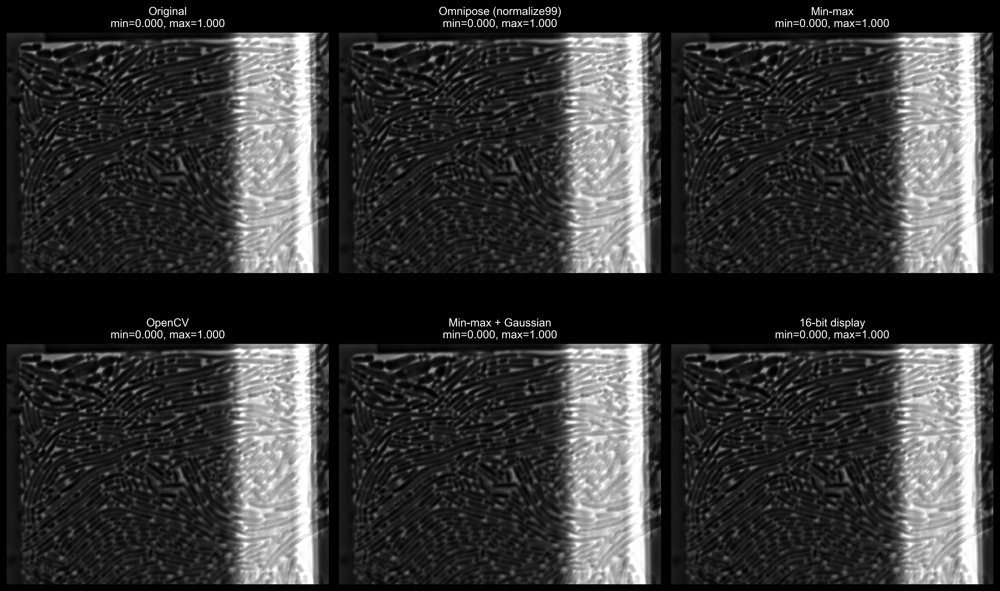


=== RECOMMENDATION ===
For Omnipose segmentation, we'll use normalize99() as it's specifically designed for cellpose/omnipose.
This method normalizes to 99th percentile to handle outliers better than simple min-max.


In [20]:
## Compare Different Normalization Methods

import cv2
from scipy.ndimage import gaussian_filter

# Use the first loaded image for comparison
if len(imgs) > 0:
    original_img = imgs[0].copy()
    print(f"Original image: min={original_img.min():.3f}, max={original_img.max():.3f}, dtype={original_img.dtype}")
    
    # Method 1: Omnipose normalize99 (already applied)
    norm_omnipose = imgs[0]  # This is already normalized with normalize99
    
    # Method 2: Min-max normalization (like in segmentation.py)
    norm_minmax = (original_img - np.min(original_img)) / (np.max(original_img) - np.min(original_img))
    
    # Method 3: OpenCV normalization (like in view_area.py)
    norm_opencv = cv2.normalize(original_img, None, 0, 1, cv2.NORM_MINMAX).astype(np.float32)
    
    # Method 4: Min-max + gaussian denoising (like in segmentation.py)
    norm_denoised = gaussian_filter(norm_minmax, sigma=1)
    
    # Method 5: 16-bit normalization (like in view_area.py for display)
    norm_16bit = cv2.normalize(original_img, None, 0, 65535, cv2.NORM_MINMAX).astype(np.uint16)
    
    print("\nNormalization comparison:")
    print(f"1. Omnipose (normalize99):     min={norm_omnipose.min():.3f}, max={norm_omnipose.max():.3f}")
    print(f"2. Min-max:                    min={norm_minmax.min():.3f}, max={norm_minmax.max():.3f}")
    print(f"3. OpenCV:                     min={norm_opencv.min():.3f}, max={norm_opencv.max():.3f}")
    print(f"4. Min-max + Gaussian filter:  min={norm_denoised.min():.3f}, max={norm_denoised.max():.3f}")
    print(f"5. 16-bit display:             min={norm_16bit.min()}, max={norm_16bit.max()}")
    
    # Visualize the differences
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()
    
    methods = [
        ("Original", original_img),
        ("Omnipose (normalize99)", norm_omnipose), 
        ("Min-max", norm_minmax),
        ("OpenCV", norm_opencv),
        ("Min-max + Gaussian", norm_denoised),
        ("16-bit display", norm_16bit.astype(np.float32)/65535)  # Scale for display
    ]
    
    for i, (title, img) in enumerate(methods):
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(f'{title}\nmin={img.min():.3f}, max={img.max():.3f}')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Choose the best normalization for omnipose
    print("\n=== RECOMMENDATION ===")
    print("For Omnipose segmentation, we'll use normalize99() as it's specifically designed for cellpose/omnipose.")
    print("This method normalizes to 99th percentile to handle outliers better than simple min-max.")
    
else:
    print("No images loaded to compare normalization methods")

In [33]:
import cellpose_omni
from cellpose_omni import models
from cellpose_omni.models import MODEL_NAMES

MODEL_NAMES

['bact_phase_affinity',
 'bact_phase_omni',
 'bact_fluor_omni',
 'worm_omni',
 'worm_bact_omni',
 'worm_high_res_omni',
 'cyto2_omni',
 'plant_omni',
 'bact_phase_cp',
 'bact_fluor_cp',
 'plant_cp',
 'worm_cp',
 'cyto',
 'nuclei',
 'cyto2']

## Initialize Omnipose Model

Set up the Omnipose model for bacterial/cellular segmentation.

In [34]:
model_name = 'bact_phase_affinity'
model = models.CellposeModel(gpu=use_GPU, model_type=model_name)

2025-08-23 00:19:32,439	[INFO]     cellpose_omni/models.py                   	 line 438	>>bact_phase_affinity<< model set to be used
2025-08-23 00:19:32,516	[INFO]     cellpose_omni/core.py         assi...evice()	 line  68	Using GPU.
2025-08-23 00:19:32,783	[INFO]                                   __init__....()	 line 174	u-net config: ([1, 32, 64, 128, 256], 3, 2)


## Run Segmentation

Apply Omnipose segmentation to our image sequence.

In [25]:
import time
n = [-1] # make a list of integers to select which images you want to segment
n = range(nimg) # or just segment them all 

# define parameters
params = {'channels':None, # always define this if using older models, e.g. [0,0] with bact_phase_omni
          'rescale': None, # upscale or downscale your images, None = no rescaling 
          'mask_threshold': -2, # erode or dilate masks with higher or lower values between -5 and 5 
          'flow_threshold': 0, # default is .4, but only needed if there are spurious masks to clean up; slows down output
          'transparency': True, # transparency in flow output
          'omni': True, # we can turn off Omnipose mask reconstruction, not advised 
          'cluster': True, # use DBSCAN clustering
          'resample': True, # whether or not to run dynamics on rescaled grid or original grid 
          'verbose': False, # turn on if you want to see more output 
          'tile': False, # average the outputs from flipped (augmented) images; slower, usually not needed 
          'niter': None, # default None lets Omnipose calculate # of Euler iterations (usually <20) but you can tune it for over/under segmentation 
          'augment': False, # Can optionally rotate the image and average network outputs, usually not needed 
          'affinity_seg': True, # new feature, stay tuned...
         }

tic = time.time() 
masks, flows, styles = model.eval([imgs[i] for i in n],**params)

net_time = time.time() - tic

print('total segmentation time: {}s'.format(net_time))

  0%|          | 0/2 [00:00<?, ?it/s]

total segmentation time: 13.211442947387695s


## Visualize Segmentation Results

Error visualizing image 0: list index out of range


<Figure size 83520x15600 with 0 Axes>

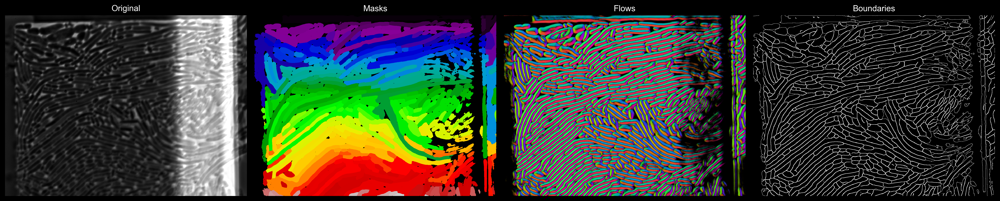

Error visualizing image 1: list index out of range


<Figure size 83520x15600 with 0 Axes>

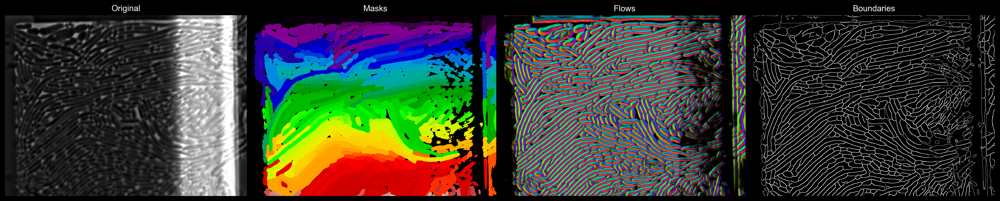

In [50]:
from cellpose_omni import plot
import omnipose
import matplotlib.pyplot as plt

for idx, i in enumerate(n):
    maski = masks[idx]  # get masks
    bdi = flows[idx][-1]  # get boundaries
    flowi = flows[idx][0]  # get RGB flows 
    
    # Set up the output figure to better match the resolution of the images 
    f = 15
    szX = maski.shape[-1] / plt.rcParams['figure.dpi'] * f
    szY = maski.shape[-2] / plt.rcParams['figure.dpi'] * f
    
    # Create figure with black background (if needed)
    fig = plt.figure(figsize=(szX*4, szY), facecolor='black', frameon=False)
    
    try:
        # Use the plot.show_segmentation function
        plot.show_segmentation(fig, omnipose.utils.normalize99(imgs[i]), 
                              maski, flowi, bdi, 
                              channels=None, 
                              omni=True,
                              interpolation=None)
        
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Error visualizing image {i}: {e}")
        # Manual visualization as fallback
        fig, axes = plt.subplots(1, 4, figsize=(20, 5))
        
        # Original image
        axes[0].imshow(omnipose.utils.normalize99(imgs[i]), cmap='gray')
        axes[0].set_title('Original')
        axes[0].axis('off')
        
        # Masks
        axes[1].imshow(maski, cmap='nipy_spectral')
        axes[1].set_title('Masks')
        axes[1].axis('off')
        
        # Flows
        axes[2].imshow(flowi)
        axes[2].set_title('Flows')
        axes[2].axis('off')
        
        # Boundaries
        axes[3].imshow(bdi, cmap='gray')
        axes[3].set_title('Boundaries')
        axes[3].axis('off')
        
        plt.tight_layout()
        plt.show()
    
    finally:
        plt.close(fig)